In [1]:
import pandas as pd
import numpy as np

weather = pd.read_csv("weather.csv", index_col="DATE")

In [2]:
weather

,STATION,NAME,ACMH,ACSH,AWND,FMTM,PGTM,PRCP,SNOW,SNWD,...,WT14,WT15,WT16,WT17,WT18,WT19,WT21,WT22,WV01,WV20
DATE,,,,,,,,,,,,,,,,,,,,,
1970-01-01,USW00014732,"LAGUARDIA AIRPORT, NY US",80.0,90.0,NaN,NaN,NaN,0.00,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1970-01-02,USW00014732,"LAGUARDIA AIRPORT, NY US",20.0,20.0,NaN,NaN,NaN,0.00,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1970-01-03,USW00014732,"LAGUARDIA AIRPORT, NY US",90.0,100.0,NaN,NaN,NaN,0.05,0.4,0.0,...,NaN,NaN,1.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN
1970-01-04,USW00014732,"LAGUARDIA AIRPORT, NY US",20.0,20.0,NaN,NaN,NaN,0.00,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1970-01-05,USW00014732,"LAGUARDIA AIRPORT, NY US",30.0,10.0,NaN,NaN,NaN,0.00,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-11-13,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",NaN,NaN,14.76,NaN,NaN,0.09,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-11-14,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",NaN,NaN,12.97,NaN,NaN,0.00,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-11-15,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",NaN,NaN,11.18,NaN,NaN,0.43,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [3]:
# Clean invalid columns
null_pct = weather.apply(pd.isnull).sum()/weather.shape[0]
valid_columns = weather.columns[null_pct < .05]

In [4]:
weather = weather[valid_columns].copy()
weather.columns = weather.columns.str.lower()

In [5]:
weather.index = pd.to_datetime(weather.index)

In [6]:
weather["station"].unique()

array(['USW00014732', 'USW00094789'], dtype=object)

In [7]:
lga = weather[weather["station"] == "USW00014732"].copy()
weather = weather[weather["station"] == "USW00094789"].copy()

In [8]:
weather = weather.merge(lga, left_index=True, right_index=True)

In [9]:
weather

,station_x,name_x,prcp_x,snow_x,snwd_x,tmax_x,tmin_x,station_y,name_y,prcp_y,snow_y,snwd_y,tmax_y,tmin_y
DATE,,,,,,,,,,,,,,
1970-01-01,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,28,22,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,28,21
1970-01-02,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,31,22,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,29,19
1970-01-03,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.02,0.0,0.0,38,25,USW00014732,"LAGUARDIA AIRPORT, NY US",0.05,0.4,0.0,35,26
1970-01-04,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,31,23,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,30,22
1970-01-05,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,35,21,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,35,21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-11-13,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.09,0.0,0.0,61,42,USW00014732,"LAGUARDIA AIRPORT, NY US",0.02,0.0,0.0,62,43
2022-11-14,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,47,35,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,46,38
2022-11-15,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.43,0.0,0.0,46,33,USW00014732,"LAGUARDIA AIRPORT, NY US",0.49,0.0,0.0,48,36


In [10]:
# Setup time series for prophet
weather["y"] = weather.shift(-1)["tmax_x"]
weather = weather.ffill()

In [11]:
weather["ds"] = weather.index

In [12]:
weather.shape

(19314, 16)

In [13]:
predictors = weather.columns[~weather.columns.isin(["y", "name_x", "station_x", "name_y", "station_y", "ds"])]

In [14]:
train = weather[:"2021-12-31"]
test = weather["2021-12-31":]

In [15]:
# Fit initial prophet model
from prophet import Prophet

def fit_prophet(train):
    m = Prophet()
    for p in predictors:
        m.add_regressor(p)
    m.fit(train)
    return m

m = fit_prophet(train)

09:19:11 - cmdstanpy - INFO - Chain [1] start processing
09:19:22 - cmdstanpy - INFO - Chain [1] done processing


In [16]:
predictions = m.predict(test)

In [17]:
predictions

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,extra_regressors_additive,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2021-12-31,61.461607,43.246134,58.765145,61.461607,61.461607,-10.170677,-10.170677,-10.170677,-2.405809,...,0.024379,0.024379,0.024379,-7.789247,-7.789247,-7.789247,0.0,0.0,0.0,51.290930
1,2022-01-01,61.461387,44.442624,59.400265,61.461387,61.461387,-9.473567,-9.473567,-9.473567,-1.625051,...,-0.016439,-0.016439,-0.016439,-7.832077,-7.832077,-7.832077,0.0,0.0,0.0,51.987820
2,2022-01-02,61.461167,41.819642,57.581401,61.461167,61.461167,-11.882032,-11.882032,-11.882032,-4.101473,...,0.092278,0.092278,0.092278,-7.872838,-7.872838,-7.872838,0.0,0.0,0.0,49.579135
3,2022-01-03,61.460947,31.590585,46.120521,61.460947,61.460947,-22.893205,-22.893205,-22.893205,-15.309556,...,0.327912,0.327912,0.327912,-7.911561,-7.911561,-7.911561,0.0,0.0,0.0,38.567742
4,2022-01-04,61.460727,28.157897,43.799751,61.460727,61.460727,-25.300457,-25.300457,-25.300457,-17.259412,...,-0.092777,-0.092777,-0.092777,-7.948267,-7.948267,-7.948267,0.0,0.0,0.0,36.160271
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
317,2022-11-13,61.391851,48.609998,63.917960,61.374664,61.403135,-5.038379,-5.038379,-5.038379,-2.145397,...,0.092278,0.092278,0.092278,-2.985261,-2.985261,-2.985261,0.0,0.0,0.0,56.353472
318,2022-11-14,61.391631,42.743851,57.597705,61.374364,61.403080,-11.143890,-11.143890,-11.143890,-8.348741,...,0.327912,0.327912,0.327912,-3.123061,-3.123061,-3.123061,0.0,0.0,0.0,50.247742
319,2022-11-15,61.391411,41.953118,57.120326,61.374074,61.403235,-12.080521,-12.080521,-12.080521,-8.727531,...,-0.092777,-0.092777,-0.092777,-3.260213,-3.260213,-3.260213,0.0,0.0,0.0,49.310890
320,2022-11-16,61.391191,42.935116,58.450038,61.373784,61.403186,-10.702986,-10.702986,-10.702986,-7.044226,...,-0.262123,-0.262123,-0.262123,-3.396637,-3.396637,-3.396637,0.0,0.0,0.0,50.688205


In [18]:
from prophet.plot import plot_plotly, plot_components_plotly, plot_cross_validation_metric

plot_components_plotly(m, predictions)

In [19]:
from prophet.utilities import regressor_coefficients

regressor_coefficients(m)

,regressor,regressor_mode,center,coef_lower,coef,coef_upper
0,prcp_x,additive,0.118130,-0.195021,-0.195021,-0.195021
1,snow_x,additive,0.064540,-0.014992,-0.014992,-0.014992
2,snwd_x,additive,0.209635,0.064361,0.064361,0.064361
3,tmax_x,additive,61.758648,0.012656,0.012656,0.012656
4,tmin_x,additive,47.494024,-0.083525,-0.083525,-0.083525
5,prcp_y,additive,0.123378,-0.322636,-0.322636,-0.322636
6,snow_y,additive,0.071347,-0.488412,-0.488412,-0.488412
7,snwd_y,additive,0.217759,-0.202331,-0.202331,-0.202331
8,tmax_y,additive,62.609277,0.281274,0.281274,0.281274
9,tmin_y,additive,48.923130,0.426891,0.426891,0.426891


In [20]:
predictions.index = test.index
predictions["actual"] = test["y"]

In [21]:
def mse(predictions, actual_label="actual", pred_label="yhat"):
    se = ((predictions[actual_label] - predictions[pred_label]) ** 2)
    print(se.mean())
    
mse(predictions)

40.51782773503447


In [22]:
# Cross validate across data set
from prophet.diagnostics import cross_validation, performance_metrics


m = fit_prophet(weather)
cv = cross_validation(m, initial=f'{365 * 5} days', period='180 days', horizon = '180 days', parallel="processes")

09:19:35 - cmdstanpy - INFO - Chain [1] start processing
09:19:44 - cmdstanpy - INFO - Chain [1] done processing


In [23]:
mse(cv, actual_label="y")

36.18628357359244


<Axes: >

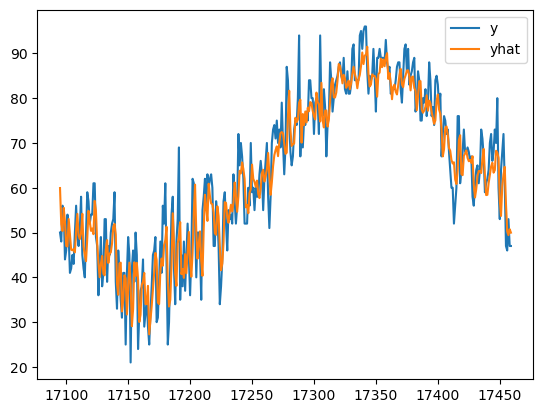

In [24]:
cv[["y", "yhat"]][-365:].plot()

In [25]:
# Predict one day ahead with high accuracy
m = fit_prophet(weather)
m.predict(weather.iloc[-1:])

09:25:23 - cmdstanpy - INFO - Chain [1] start processing
09:25:32 - cmdstanpy - INFO - Chain [1] done processing


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,extra_regressors_additive,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2022-11-17,61.679441,42.485017,57.999744,61.679441,61.679441,-11.531253,-11.531253,-11.531253,-7.90542,...,-0.065182,-0.065182,-0.065182,-3.560651,-3.560651,-3.560651,0.0,0.0,0.0,50.148188


In [26]:
# Predict multiple days ahead with lower accuracy
m = Prophet()
m.fit(weather)
future = m.make_future_dataframe(periods=365)
forecast = m.predict(future)

09:25:35 - cmdstanpy - INFO - Chain [1] start processing
09:25:39 - cmdstanpy - INFO - Chain [1] done processing


In [27]:
from prophet.plot import plot_plotly

plot_plotly(m, forecast)